In [1]:
import folium
import pandas as pd
import json

# Step 1: Get the regions in germany including thier Coropleth structure 

Source: https://github.com/isellsoap/deutschlandGeoJSON

In [2]:
with open('./4_niedrig.geo.json', encoding='utf-8') as f:
    geo_data_germany = json.load(f)

geo_data_germany['features'][1]

{'type': 'Feature',
 'id': 1,
 'properties': {'ID_0': 86,
  'ISO': 'DEU',
  'NAME_0': 'Germany',
  'ID_1': 9,
  'NAME_1': 'Niedersachsen',
  'ID_2': 23,
  'NAME_2': 'Weser-Ems',
  'ID_3': 245,
  'NAME_3': 'Osnabrück Städte',
  'NL_NAME_3': None,
  'VARNAME_3': None,
  'TYPE_3': 'Kreisfreie Städte',
  'ENGTYPE_3': 'Urban district'},
 'geometry': {'type': 'Polygon',
  'coordinates': [[[7.963789939880371, 52.3254508972168],
    [8.011850357055778, 52.34164047241211],
    [8.025308609008789, 52.3198509216308],
    [8.09921932220459, 52.321319580078125],
    [8.093870162963867, 52.310081481933594],
    [8.119648933410701, 52.29198074340832],
    [8.149400711059684, 52.30368041992199],
    [8.181080818176326, 52.28565216064453],
    [8.157988548278809, 52.26663970947271],
    [8.121719360351506, 52.262248992919865],
    [8.13599967956543, 52.23273849487305],
    [8.117508888244743, 52.23612213134771],
    [8.11833858489996, 52.22497940063482],
    [8.080390930175781, 52.242858886718864],
   

# Step 2: Get some data on wealth (availible income per household and GDP per person) for each region from destatis.de (german statistical institute).
Source: https://www-genesis.destatis.de/genesis/online

### FYI: destatis.de offers an unlimited API. However, the API is cumbersome at best and not worth the time for a simple case like this. Hence, let's load the according table via CSV.

In [292]:
df_destatis = pd.read_csv("bip_and_avinc_per_inh.csv",sep=";")
df_destatis = df_destatis[:445]
df_destatis = df_destatis.astype({'lfd': 'int32'})
df_destatis.head(5)

,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,bip_pp,Einwohner
0,1,DE1,8.0,BW,1.0,NaN,NaN,Baden-Württemberg,24 892,46 480,11046.0
1,2,DE11,81.0,BW,NaN,2.0,NaN,"Stuttgart, Regierungsbezirk",25 569,53 144,4135.0
2,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25 788,90 518,634.0
3,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25 597,66 535,391.0
4,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25 582,42 726,533.0


### Now comes the realization, that the regions are not identically numbered nor identically named to the geo data. In 2008 there was a reform where some regions were changed. The following functions are to map the ID's of both in two passes. First, it tries to automatically map the clear ones (identical names) and then in a send pass it requires the uses input to manually search until a match is found. Everything is saved and then loaded into a csv file.

Feel free to skip over to the last line where the csv is loaded, there rest is just for documentation.

In [ ]:
import re 

for i in range(len(geo_data_germany['features'])):
    geo_name = geo_data_germany['features'][i]["properties"]["NAME_3"]
    alt_name = geo_name
    geo_typ = geo_data_germany['features'][i]["properties"]["TYPE_3"]
    geo_id = geo_data_germany['features'][i]["id"]
    if geo_id in mapper:
        continue
    options = destatis_working[destatis_working["Gebietseinheit"].str.contains(re.split(', |_|-|\s', geo_name)[0])].values
    if len(options) == 0:
        alt_name = geo_data_germany['features'][i]["properties"]["VARNAME_3"]
        try:
            options = destatis_working[destatis_working["Gebietseinheit"].str.contains(re.split(', |_|-|\s', alt_name)[0])].values
        except:
            mapper[geo_id] = -1
            continue
        if len(options) == 0:
            mapper[geo_id] = -1
    if len(options) == 1:
        mapper[geo_id] = options[0,0]
        destatis_working.drop(destatis_working[destatis_working.lfd==options[0,0]].index,inplace=True)
    else:
        print(f"{geo_id} {geo_name} {alt_name} {geo_typ} options:{options[:,(0,7)]}")
        inp = input()
        if int(inp)==99:
            mapper[geo_id] = -1
        else:
            mapper[geo_id] = options[int(inp)-1,0]
            destatis_working.drop(destatis_working[destatis_working.lfd==options[int(inp)-1,0]].index,inplace=True)

print(mapper)

In [ ]:
for i in range(len(geo_data_germany['features'])):
    geo_name = geo_data_germany['features'][i]["properties"]["NAME_3"]
    alt_name = geo_name
    geo_typ = geo_data_germany['features'][i]["properties"]["TYPE_3"]
    geo_id = geo_data_germany['features'][i]["id"]
    if mapper[geo_id]==-1 or geo_id not in mapper:
        options = destatis[destatis["Gebietseinheit"].str.contains(re.split(', |_|-|\s', geo_name)[0])].values
        print(f"{geo_id} {geo_name} {alt_name} {geo_typ} options:{options[:,(0,7)]}")
        while True:
            print("enter new search term:")
            inp = input()
            options = destatis[destatis["Gebietseinheit"].str.contains(re.split(', |_|-|\s', inp)[0])].values
            if len(options)>0:
                print(options[:,(0,7)])
                inp = input()
                if int(inp)==99:
                    continue
                mapper[geo_id] = options[int(inp)-1,0]
                break
            else:
                print("No options found.")

In [ ]:
import csv
csv_file = "AreasDestatisMapper.csv"
with open(csv_file, 'w') as f:
    w = csv.DictWriter(f, mapper.keys())
    w.writeheader()
    w.writerow(mapper)

In [182]:
import csv

csv_file = "AreasDestatisMapper.csv"
with open(csv_file, 'r') as f:
    reader = csv.DictReader(f)
    for row in reader:
        mapper = dict(row)

df_mapper = pd.DataFrame({"id_json":mapper.keys(),"id_destatis":mapper.values()})
df_mapper = df_mapper.astype({"id_json":"int32","id_destatis":"int32"})
df_mapper.head()

,id_json,id_destatis
0,0,262
1,1,253
2,2,263
3,3,264
4,4,265


# Step 3: Merge the Dataframes and show availible income and GDP on a map

In [297]:
df_data = pd.merge(df_destatis,df_mapper,left_on="lfd",right_on="id_destatis")

df_data["ve_pp"] = df_data["ve_pp"].str.replace(" ","")
df_data["ve_pp"] = df_data["ve_pp"].str.replace('…',"20000")
df_data["bip_pp"] = df_data["bip_pp"].str.replace(" ","")
df_data["Einwohner"] = df_data["Einwohner"]*1000

df_data = df_data.astype({"lfd":"int32","ve_pp":"int32","bip_pp":"int32","id_json":"int32","id_destatis":"int32","Einwohner":"int32"})

df_data

,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,bip_pp,Einwohner,id_json,id_destatis
0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,90518,634000,20,3
1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,66535,391000,57,4
2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,42726,533000,58,5
3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,34635,257000,59,6
4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,46974,543000,64,7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,439,DEG0J,16074.0,TH,NaN,NaN,3.0,Saale-Holzland-Kreis,20183,23262,83000,423,439
430,440,DEG0K,16075.0,TH,NaN,NaN,3.0,Saale-Orla-Kreis,19740,27482,81000,424,440
431,441,DEG0L,16076.0,TH,NaN,NaN,3.0,"Greiz, Landkreis",20392,23940,99000,417,441
432,442,DEG0M,16077.0,TH,NaN,NaN,3.0,"Altenburger Land, Landkreis",19883,22319,90000,412,442


In [11]:
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='Availible Income per Houshold',
    data=df_data,
    columns=['id_json', 've_pp'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Availible Income per Houshold in Euro'
)

folium.LayerControl().add_to(m)
m

In [12]:
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='GDP Per Person',
    data=df_data['bip_pp'].where(df_data['bip_pp'] <= 70000, 70000) , #capped at 70000 to not respect outliers from big industires.
    columns=['id_json', 'bip_pp'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='GDP Per Person in Euro'
)

folium.LayerControl().add_to(m)
m

In [300]:
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='Inhabitants',
    data=df_data,
    columns=['id_json', 'Einwohner'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Inhabitants'
)

folium.LayerControl().add_to(m)
m

# Step 4: Get the count of Pizza and Döner via Foursquare

## Step 4.1: Calculate centroid(s) for each region

The foursquare API requires a coordinate-set and a radius. The best solution appears to calculate the centroid for each region and the mean radius (centroid to all polygon point geodestic distance) and use this for the seach.

However, there is a complication which makes things much more algorithmic and interesing (thank you foursquare): The maximum search results is limited to 50 which, in densly populated regions, is not enough and both Döner or more Pizza would end up getting the count=50. 

Hence, we need to split the split the region into sub-regions. A good approximation to do this is to use multiple centroids. Any solution to calulate these (that I could come up with) is iterative. It apears natural to use the K-Means means centroids for this by accessing them via cluster_centers_ list. 

There is a bias however towards region with high geometric complexity (many points). This could be reduced by using the high resolution dataset for the geo data or fractality reduction methods or others. Different algorithms will come up with different solutions but since only the ratio between the two counts really matters for us, there is no reason to find a perfect solution.

(Though: Another method could be to rasterize Germany into slightly overlapping circles so that everything is coveres with at least one search request and then push the search results to the accoridng region by writing an algorithm that checks in which polygon the result is in. This would probably require even more requests and much more compute but would be complete and precise where the centroid method is only statistically valid.)

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 0 0 0 0 0 0 0]
[[ 8.58934564 52.9882387 ]
 [ 8.23111275 53.03257179]]


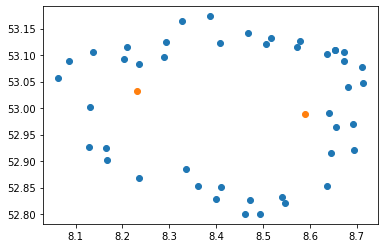

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import geopy.distance

region_no = 0
K = 2

points = geo_data_germany['features'][region_no]["geometry"]["coordinates"][0]

# run k-means clustering
kmeans = KMeans(n_clusters=K, random_state=0).fit(points)

# check cluster labels generated for each row in the dataframe
print(kmeans.labels_)
print(kmeans.cluster_centers_)

plt.scatter(*zip(*points))
plt.scatter(*zip(*kmeans.cluster_centers_))
plt.show()

### Now calculate the radi. Use the mean distance of each cluster to the new centroids.

In [23]:
for i in range(K):
    radius_lst = []
    centroid = (kmeans.cluster_centers_[i][1],kmeans.cluster_centers_[i][0])
    for j,point in enumerate(points):
        if kmeans.labels_[j] == i:
            lon,lat = point[1],point[0]
            radius_lst.append(geopy.distance.distance(centroid,(lon,lat)).km)

    radius = np.array(radius_lst).mean().tolist()
    print(radius)

14.380889669074113
12.859606604443512


### Appears to work. So let's put this into a function:

In [25]:
def split_into_multiple_centroids(coorinates,K):
    # function splits the polygon defined by coordinates into n centroids and returns thier positions and according radi
    kmeans = KMeans(n_clusters=K, random_state=0).fit(coorinates)

    radi = []
    for i in range(K):
        radius_lst = []
        centroid = (kmeans.cluster_centers_[i][1],kmeans.cluster_centers_[i][0])
        for j,point in enumerate(coorinates):
            if kmeans.labels_[j] == i:
                lon,lat = point[1],point[0]
                radius_lst.append(geopy.distance.distance(centroid,(lon,lat)).km)

        radius = np.array(radius_lst).mean().tolist()
        radi.append(radius)
    
    return kmeans.cluster_centers_.tolist(), radi

split_into_multiple_centroids(geo_data_germany['features'][0]["geometry"]["coordinates"][0],2)

([[8.589345638568641, 52.988238701453604],
  [8.231112745073148, 53.03257179260258]],
 [14.380889669074113, 12.859606604443512])

## 4.2 Get the counts


In [301]:
df_data["doener"] = np.NaN
df_data["pizza"] = np.NaN
df_data["centroids"] = np.NaN
df_data['centroids'] = df_data['centroids'].fillna("").apply(list)
df_data["radi"] = np.NaN
df_data['radi'] = df_data['radi'].fillna("").apply(list)
df_data.head()

,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,bip_pp,Einwohner,id_json,id_destatis,doener,pizza,centroids,radi
0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,90518,634000,20,3,NaN,NaN,[],[]
1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,66535,391000,57,4,NaN,NaN,[],[]
2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,42726,533000,58,5,NaN,NaN,[],[]
3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,34635,257000,59,6,NaN,NaN,[],[]
4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,46974,543000,64,7,NaN,NaN,[],[]


### Prepare API and helper function:

Here is a choice and a bias:
Many places that are primarily "Döners" also sell pizza and Foursquare will find them as such.
This is not true the other way round.
The question here is for "real" Pizza places. So only places have categories matching a "specialized" pizza place are counted as pizza where every Döner is counted as Döner.
However, this reduces the number of places where pizza would be availibe. 

In [302]:
import requests
CLIENT_ID = 'CDEKOKTSRIVO1CLOZRUA25ES0IBRZZGDB2G3NM0RI0OIXLA2' # your Foursquare ID
CLIENT_SECRET = 'D0UCBHV15LAA3LWNHRGDEOQOVQLARPQ1DDOJLKIMLRTG4O2U' # your Foursquare Secret
ACCESS_TOKEN = 'NERZ41WZP5LRSGPY51HDIV0BKLZ2SUV4L242F5VZ0M4UGPBA' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 1000
pizza_categories = ("Pizza","Italian","Restaurant","Fast","Snack") #Some döner places also sell pizza. Filter them. 


def get_count_pizza_doener(coordinate,radius):
    radius = int(radius*1000)
    print(f"searching foursquare using: log:{coordinate[1]}[°] lat:{coordinate[0]}[°] radius:{radius}[m]")
    try:
        search_query = 'Pizza'
        url = f'https://api.foursquare.com/v2/venues/search?client_id={CLIENT_ID}&client_secret={CLIENT_SECRET}&ll={coordinate[1]},{coordinate[0]}&oauth_token={ACCESS_TOKEN}&v={VERSION}&query={search_query}&radius={radius}&limit={LIMIT}'
        results = requests.get(url).json()
        pizza_count = 0
        venues = results["response"]["venues"]
        for venue in venues:
            for cat in venue["categories"]:
                if len(cat) > 0:
                    if cat["name"].split(" ")[0] in pizza_categories:
                        pizza_count += 1

        search_query = 'Döner'
        url = f'https://api.foursquare.com/v2/venues/search?client_id={CLIENT_ID}&client_secret={CLIENT_SECRET}&ll={coordinate[1]},{coordinate[0]}&oauth_token={ACCESS_TOKEN}&v={VERSION}&query={search_query}&radius={radius}&limit={LIMIT}'
        results = requests.get(url).json()
        doener_count = len(results["response"]["venues"])
        print(f"found:{pizza_count} {doener_count}")
    except:
        pizza_count = -1
        doener_count = -1
        print(f"FAILED")    

    return pizza_count, doener_count

### Use an interation that:
1. Goes though all regions
2. Calculates K=1 centroid and checks if it is below the search result limit (<50)
3. if not, reapeat step 2 with K += 1
4. Add the cummulative count for Pizza and Döner as well as the centroid position and radi to the list. 
5. Go back to step one for next region

In [311]:

def get_count_pizza_doener_tester(coordinate,radius):
    #test the API response function with random data to unit test the iteration.
    return np.random.randint(0,60), np.random.randint(0,60)

def depth(l):
    #recursive method to find depth of a list in case it is unkown.
    if isinstance(l, list):
        return 1 + max(depth(item) for item in l)
    else:
        return 0

for i in range(len(df_data)):
    print(f"\n\nid:{df_data.loc[i,'id_destatis']} id_json:{df_data.loc[i,'id_json']} place:{df_data.loc[i,'Gebietseinheit']}")
    
    #skip if already present.
    if pd.notna(df_data.loc[i,"pizza"]) and pd.notna(df_data.loc[i,"doener"]):
        print(f"skipping: {df_data.loc[i,'Gebietseinheit']}")
        continue
    df_data.loc[i,"centroids"].clear()
    df_data.loc[i,"radi"].clear()
    id_json = df_data.loc[i,"id_json"]
    coordinates_list = geo_data_germany['features'][id_json]["geometry"]["coordinates"]
    total_count_pizza = 0
    total_count_doener = 0

    #the json has some regions that have sub-sections and hence the list is deeper. Account for this.
    if depth(coordinates_list) == 3: 
        coordinates_list = [coordinates_list]

    #There can be multiple regions/polygons for one area. Iterate though all.
    for coordinates in coordinates_list:
        print("NEXT Coordinate set")
        coordinates = coordinates[0]
        K = 1
        temp_count_pizza = 0
        temp_count_doener = 0
        #divide into sub-regions with smaller radius until the search results are below 50.
        while True:
            break_flag = False
            print(f"K:{K}")
            centroids, radi = split_into_multiple_centroids(coordinates,K)
            #add up the results from all centroids. If any returns above 50 break and retry with smaller regions.
            for centroid,radius in zip(centroids,radi):
                print("NEXT Centroid set")
                pizza_count, doener_count = get_count_pizza_doener(centroid, radius)
                if pizza_count < 50 and doener_count < 50:
                    print("Count OK. Adding.")
                    temp_count_pizza += pizza_count
                    temp_count_doener += doener_count
                else:
                    print("Count TOO HIGH. Splitting into more sub-regions....")
                    K += 1
                    break_flag = True
                    break
            if not break_flag:
                df_data.loc[i,"centroids"].append(centroids)
                df_data.loc[i,"radi"].append(radi)
                break #end searching for small enough sub-regions.
            
        total_count_pizza += temp_count_pizza
        total_count_doener += temp_count_doener

    #add to dataframe
    if total_count_doener == -1 or total_count_pizza == -1:
        print("Error in API! Quit.")
        break
    print(f"adding to df: {total_count_pizza} {total_count_doener}")
    df_data.loc[i,"pizza"] = total_count_pizza
    df_data.loc[i,"doener"] = total_count_doener
    



        

33 id_json:310 place:Mayen-Koblenz, Landkreis
skipping: Mayen-Koblenz, Landkreis


id:334 id_json:311 place:Neuwied, Landkreis
skipping: Neuwied, Landkreis


id:335 id_json:313 place:Rhein-Lahn-Kreis
skipping: Rhein-Lahn-Kreis


id:336 id_json:314 place:Westerwaldkreis
skipping: Westerwaldkreis


id:337 id_json:308 place:Cochem-Zell, Landkreis
skipping: Cochem-Zell, Landkreis


id:338 id_json:312 place:Rhein-Hunsrück-Kreis
skipping: Rhein-Hunsrück-Kreis


id:340 id_json:337 place:Trier, Kreisfreie Stadt
skipping: Trier, Kreisfreie Stadt


id:341 id_json:334 place:Bernkastel-Wittlich, Landkreis
skipping: Bernkastel-Wittlich, Landkreis


id:342 id_json:335 place:Eifelkreis Bitburg-Prüm
skipping: Eifelkreis Bitburg-Prüm


id:343 id_json:338 place:Vulkaneifel, Landkreis
skipping: Vulkaneifel, Landkreis


id:344 id_json:336 place:Trier-Saarburg, Landkreis
skipping: Trier-Saarburg, Landkreis


id:346 id_json:318 place:Frankenthal (Pfalz), Kreisfreie Stadt
skipping: Frankenthal (Pfalz), Kreis

In [312]:
df_data.describe()

,lfd,reg,nuts1,nuts2,nuts3,ve_pp,bip_pp,Einwohner,id_json,id_destatis,doener,pizza,doener_norm,pizza_norm,ratio,ratio_norm,density_100k
count,434.000000,434.000000,4.0,5.0,431.0,434.000000,434.000000,4.340000e+02,434.000000,434.000000,434.000000,434.000000,197.000000,197.000000,197.000000,197.000000,197.000000
mean,231.576037,8694.638249,1.0,2.0,3.0,22473.188940,36741.050691,2.259585e+05,216.500000,231.576037,13.527650,14.525346,0.182006,0.162311,0.046166,-0.063309,15.143762
std,129.174533,4028.388153,0.0,0.0,0.0,2636.773132,16344.668370,2.924998e+05,125.429263,129.174533,13.205619,13.086338,0.182847,0.158820,0.301860,0.344925,9.073760
min,3.000000,1.000000,1.0,2.0,3.0,16450.000000,16320.000000,3.400000e+04,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,-0.777778,-1.000000,0.745342
25%,120.250000,5913.250000,1.0,2.0,3.0,20504.000000,27229.750000,1.110000e+05,108.250000,120.250000,5.000000,5.000000,0.065789,0.061728,-0.151515,-0.271142,8.490566
50%,230.500000,8419.000000,1.0,2.0,3.0,22385.000000,32420.500000,1.650000e+05,216.500000,230.500000,9.000000,10.000000,0.118421,0.111111,0.052632,-0.031847,13.000000
75%,350.750000,11549.750000,1.0,2.0,3.0,24017.000000,39724.750000,2.535000e+05,324.750000,350.750000,18.000000,20.000000,0.250000,0.222222,0.250000,0.169231,19.330855
max,444.000000,16077.000000,1.0,2.0,3.0,36883.000000,182301.000000,3.629000e+06,433.000000,444.000000,76.000000,82.000000,1.000000,1.000000,1.000000,1.000000,48.120301


### Save the result to csv file:

In [313]:
df_data.to_csv(r'df_data.csv',index=True)

# Step 5: Exploring the data 

## 5.1 Add some columns and prepare tables for plotting

In [6]:
#load the data. Skip if already in memory.
import pandas as pd
import numpy as np
df_data=pd.read_csv(r"df_data.csv")
df_data

,Unnamed: 0,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,...,id_destatis,doener,pizza,centroids,radi,doener_norm,pizza_norm,ratio,ratio_norm,density_100k
0,0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,...,3,46.0,34.0,"[[[9.167738959902849, 48.784316289992596]]]",[[8.232163390963873]],0.605263,0.407407,-0.150000,-0.195380,12.618297
1,1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,...,4,22.0,30.0,"[[[8.948662200064065, 48.67286084732923]]]",[[14.698258711738177]],0.289474,0.358025,0.153846,0.105871,13.299233
2,2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,...,5,21.0,33.0,"[[[9.360648341800887, 48.63652502972151]]]",[[14.916208662529932]],0.276316,0.395062,0.222222,0.176869,10.131332
3,3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,...,6,15.0,13.0,"[[[9.725887227058445, 48.68221721649173]]]",[[14.92280080269137]],0.197368,0.148148,-0.071429,-0.142454,10.894942
4,4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,...,7,27.0,26.0,"[[[9.284696318802085, 48.95612051858102], [8.9...","[[9.164053250083958, 11.021898778933592]]",0.355263,0.308642,-0.018868,-0.070223,9.760589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,429,439,DEG0J,16074.0,TH,NaN,NaN,3.0,Saale-Holzland-Kreis,20183,...,439,8.0,20.0,"[[[11.72491507096728, 50.91739959716802]]]",[[16.242266771603234]],NaN,NaN,NaN,NaN,NaN
430,430,440,DEG0K,16075.0,TH,NaN,NaN,3.0,Saale-Orla-Kreis,19740,...,440,1.0,1.0,"[[[11.723519545335071, 50.58715937687806]]]",[[18.76862269967449]],NaN,NaN,NaN,NaN,NaN
431,431,441,DEG0L,16076.0,TH,NaN,NaN,3.0,"Greiz, Landkreis",20392,...,441,11.0,11.0,"[[[12.107380697998861, 50.77969896340677]]]",[[16.599747369585316]],NaN,NaN,NaN,NaN,NaN
432,432,442,DEG0M,16077.0,TH,NaN,NaN,3.0,"Altenburger Land, Landkreis",19883,...,442,9.0,8.0,"[[[12.40755112226621, 50.944133847258854]]]",[[13.577902906910163]],NaN,NaN,NaN,NaN,NaN


### Add columns with scaled data (both realtive and absolut numbers are interesting in this case)

In [7]:
from sklearn.preprocessing import StandardScaler,MinMaxScaler
#scaler = StandardScaler()
scaler = MinMaxScaler()
df_data["doener_norm"]=scaler.fit_transform(df_data[["doener"]].to_numpy())
scaler = MinMaxScaler()
df_data["pizza_norm"]=scaler.fit_transform(df_data[["pizza"]].to_numpy())
df_data

,Unnamed: 0,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,...,id_destatis,doener,pizza,centroids,radi,doener_norm,pizza_norm,ratio,ratio_norm,density_100k
0,0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,...,3,46.0,34.0,"[[[9.167738959902849, 48.784316289992596]]]",[[8.232163390963873]],0.605263,0.414634,-0.150000,-0.195380,12.618297
1,1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,...,4,22.0,30.0,"[[[8.948662200064065, 48.67286084732923]]]",[[14.698258711738177]],0.289474,0.365854,0.153846,0.105871,13.299233
2,2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,...,5,21.0,33.0,"[[[9.360648341800887, 48.63652502972151]]]",[[14.916208662529932]],0.276316,0.402439,0.222222,0.176869,10.131332
3,3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,...,6,15.0,13.0,"[[[9.725887227058445, 48.68221721649173]]]",[[14.92280080269137]],0.197368,0.158537,-0.071429,-0.142454,10.894942
4,4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,...,7,27.0,26.0,"[[[9.284696318802085, 48.95612051858102], [8.9...","[[9.164053250083958, 11.021898778933592]]",0.355263,0.317073,-0.018868,-0.070223,9.760589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,429,439,DEG0J,16074.0,TH,NaN,NaN,3.0,Saale-Holzland-Kreis,20183,...,439,8.0,20.0,"[[[11.72491507096728, 50.91739959716802]]]",[[16.242266771603234]],0.105263,0.243902,NaN,NaN,NaN
430,430,440,DEG0K,16075.0,TH,NaN,NaN,3.0,Saale-Orla-Kreis,19740,...,440,1.0,1.0,"[[[11.723519545335071, 50.58715937687806]]]",[[18.76862269967449]],0.013158,0.012195,NaN,NaN,NaN
431,431,441,DEG0L,16076.0,TH,NaN,NaN,3.0,"Greiz, Landkreis",20392,...,441,11.0,11.0,"[[[12.107380697998861, 50.77969896340677]]]",[[16.599747369585316]],0.144737,0.134146,NaN,NaN,NaN
432,432,442,DEG0M,16077.0,TH,NaN,NaN,3.0,"Altenburger Land, Landkreis",19883,...,442,9.0,8.0,"[[[12.40755112226621, 50.944133847258854]]]",[[13.577902906910163]],0.118421,0.097561,NaN,NaN,NaN


### Add the ratio and density: 

In [8]:
df_data["ratio"] = (df_data["pizza"]-df_data["doener"])/(df_data["pizza"]+df_data["doener"])
df_data["ratio_norm"] = (df_data["pizza_norm"]-df_data["doener_norm"])/(df_data["pizza_norm"]+df_data["doener_norm"])
df_data["density_100k"] = (df_data["pizza"]+df_data["doener"])/df_data["Einwohner"]*100000
df_data

,Unnamed: 0,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,...,id_destatis,doener,pizza,centroids,radi,doener_norm,pizza_norm,ratio,ratio_norm,density_100k
0,0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,...,3,46.0,34.0,"[[[9.167738959902849, 48.784316289992596]]]",[[8.232163390963873]],0.605263,0.414634,-0.150000,-0.186910,12.618297
1,1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,...,4,22.0,30.0,"[[[8.948662200064065, 48.67286084732923]]]",[[14.698258711738177]],0.289474,0.365854,0.153846,0.116552,13.299233
2,2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,...,5,21.0,33.0,"[[[9.360648341800887, 48.63652502972151]]]",[[14.916208662529932]],0.276316,0.402439,0.222222,0.185816,10.131332
3,3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,...,6,15.0,13.0,"[[[9.725887227058445, 48.68221721649173]]]",[[14.92280080269137]],0.197368,0.158537,-0.071429,-0.109107,10.894942
4,4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,...,7,27.0,26.0,"[[[9.284696318802085, 48.95612051858102], [8.9...","[[9.164053250083958, 11.021898778933592]]",0.355263,0.317073,-0.018868,-0.056802,9.760589
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,429,439,DEG0J,16074.0,TH,NaN,NaN,3.0,Saale-Holzland-Kreis,20183,...,439,8.0,20.0,"[[[11.72491507096728, 50.91739959716802]]]",[[16.242266771603234]],0.105263,0.243902,0.428571,0.397059,33.734940
430,430,440,DEG0K,16075.0,TH,NaN,NaN,3.0,Saale-Orla-Kreis,19740,...,440,1.0,1.0,"[[[11.723519545335071, 50.58715937687806]]]",[[18.76862269967449]],0.013158,0.012195,0.000000,-0.037975,2.469136
431,431,441,DEG0L,16076.0,TH,NaN,NaN,3.0,"Greiz, Landkreis",20392,...,441,11.0,11.0,"[[[12.107380697998861, 50.77969896340677]]]",[[16.599747369585316]],0.144737,0.134146,0.000000,-0.037975,22.222222
432,432,442,DEG0M,16077.0,TH,NaN,NaN,3.0,"Altenburger Land, Landkreis",19883,...,442,9.0,8.0,"[[[12.40755112226621, 50.944133847258854]]]",[[13.577902906910163]],0.118421,0.097561,-0.058824,-0.096582,18.888889


### Add another colum which calculates a ratio but only in cases where both pizza and doener are above a threshold otherwise it sets the ratio 0
This is useful to not show statistically irrelevant regions

In [9]:
minimum = 5
column_pizza = df_data["pizza"].to_numpy()
column_doener = df_data["doener"].to_numpy()
column_result = column_doener.copy()
for i in range(len(column_pizza)):
    if column_pizza[i] > minimum and column_doener[i] > minimum:
        column_result[i] = (column_pizza[i]-column_doener[i])/(column_pizza[i]+column_doener[i])
    elif column_pizza[i] == np.NaN or column_doener[i] == np.NaN:
        column_result[i] = np.NaN
    else: 
        column_result[i] = 0
df_data["ratio_minimum"] = column_result
df_data

,Unnamed: 0,lfd,eu,reg,land,nuts1,nuts2,nuts3,Gebietseinheit,ve_pp,...,doener,pizza,centroids,radi,doener_norm,pizza_norm,ratio,ratio_norm,density_100k,ratio_minimum
0,0,3,DE111,8111.0,BW,NaN,NaN,3.0,"Stuttgart, Landeshauptstadt, Stadtkreis",25788,...,46.0,34.0,"[[[9.167738959902849, 48.784316289992596]]]",[[8.232163390963873]],0.605263,0.414634,-0.150000,-0.186910,12.618297,-0.150000
1,1,4,DE112,8115.0,BW,NaN,NaN,3.0,"Böblingen, Landkreis",25597,...,22.0,30.0,"[[[8.948662200064065, 48.67286084732923]]]",[[14.698258711738177]],0.289474,0.365854,0.153846,0.116552,13.299233,0.153846
2,2,5,DE113,8116.0,BW,NaN,NaN,3.0,"Esslingen, Landkreis",25582,...,21.0,33.0,"[[[9.360648341800887, 48.63652502972151]]]",[[14.916208662529932]],0.276316,0.402439,0.222222,0.185816,10.131332,0.222222
3,3,6,DE114,8117.0,BW,NaN,NaN,3.0,"Göppingen, Landkreis",24173,...,15.0,13.0,"[[[9.725887227058445, 48.68221721649173]]]",[[14.92280080269137]],0.197368,0.158537,-0.071429,-0.109107,10.894942,-0.071429
4,4,7,DE115,8118.0,BW,NaN,NaN,3.0,"Ludwigsburg, Landkreis",26203,...,27.0,26.0,"[[[9.284696318802085, 48.95612051858102], [8.9...","[[9.164053250083958, 11.021898778933592]]",0.355263,0.317073,-0.018868,-0.056802,9.760589,-0.018868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
429,429,439,DEG0J,16074.0,TH,NaN,NaN,3.0,Saale-Holzland-Kreis,20183,...,8.0,20.0,"[[[11.72491507096728, 50.91739959716802]]]",[[16.242266771603234]],0.105263,0.243902,0.428571,0.397059,33.734940,0.428571
430,430,440,DEG0K,16075.0,TH,NaN,NaN,3.0,Saale-Orla-Kreis,19740,...,1.0,1.0,"[[[11.723519545335071, 50.58715937687806]]]",[[18.76862269967449]],0.013158,0.012195,0.000000,-0.037975,2.469136,0.000000
431,431,441,DEG0L,16076.0,TH,NaN,NaN,3.0,"Greiz, Landkreis",20392,...,11.0,11.0,"[[[12.107380697998861, 50.77969896340677]]]",[[16.599747369585316]],0.144737,0.134146,0.000000,-0.037975,22.222222,0.000000
432,432,442,DEG0M,16077.0,TH,NaN,NaN,3.0,"Altenburger Land, Landkreis",19883,...,9.0,8.0,"[[[12.40755112226621, 50.944133847258854]]]",[[13.577902906910163]],0.118421,0.097561,-0.058824,-0.096582,18.888889,-0.058824


In [10]:
df_data.describe()

,Unnamed: 0,lfd,reg,nuts1,nuts2,nuts3,ve_pp,bip_pp,Einwohner,id_json,id_destatis,doener,pizza,doener_norm,pizza_norm,ratio,ratio_norm,density_100k,ratio_minimum
count,434.000000,434.000000,434.000000,4.0,5.0,431.0,434.000000,434.000000,4.340000e+02,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000,434.000000
mean,216.500000,231.576037,8694.638249,1.0,2.0,3.0,22473.188940,36741.050691,2.259585e+05,216.500000,231.576037,13.527650,14.525346,0.177995,0.177138,0.062599,0.028927,14.388345,0.026021
std,125.429263,129.174533,4028.388153,0.0,0.0,0.0,2636.773132,16344.668370,2.924998e+05,125.429263,129.174533,13.205619,13.086338,0.173758,0.159589,0.333686,0.334947,9.099369,0.178750
min,0.000000,3.000000,1.000000,1.0,2.0,3.0,16450.000000,16320.000000,3.400000e+04,0.000000,3.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,0.421941,-0.600000
25%,108.250000,120.250000,5913.250000,1.0,2.0,3.0,20504.000000,27229.750000,1.110000e+05,108.250000,120.250000,5.000000,5.000000,0.065789,0.060976,-0.151515,-0.188406,7.651001,0.000000
50%,216.500000,230.500000,8419.000000,1.0,2.0,3.0,22385.000000,32420.500000,1.650000e+05,216.500000,230.500000,9.000000,10.000000,0.118421,0.121951,0.056763,0.018829,12.738911,0.000000
75%,324.750000,350.750000,11549.750000,1.0,2.0,3.0,24017.000000,39724.750000,2.535000e+05,324.750000,350.750000,18.000000,20.000000,0.236842,0.243902,0.284286,0.248999,18.912691,0.101531
max,433.000000,444.000000,16077.000000,1.0,2.0,3.0,36883.000000,182301.000000,3.629000e+06,433.000000,444.000000,76.000000,82.000000,1.000000,1.000000,1.000000,1.000000,51.219512,0.538462


## 5.2 Explore possible relations grafically

In [35]:
corr = df_data[["ve_pp","bip_pp","Einwohner","doener","pizza","ratio","density_100k"]].corr()

"""
#non-fancy heatmap
sns.heatmap(corr, 
        xticklabels=corr.columns,
        yticklabels=corr.columns)
"""

#fancy heatmap
cmap = cmap=sns.diverging_palette(5, 250, as_cmap=True)
def magnify():
    return [dict(selector="th",
                 props=[("font-size", "12pt")]),
            dict(selector="td",
                 props=[('padding', "0em 0em")]),
            dict(selector="th:hover",
                 props=[("font-size", "14pt")]),
            dict(selector="tr:hover td:hover",
                 props=[('max-width', '300px'),
                        ('font-size', '16pt')])
]

corr.style.background_gradient(cmap, axis=1)\
    .set_properties(**{'max-width': '80px', 'font-size': '10pt'})\
    .set_caption("Correlation Analysis")\
    .set_precision(2)\
    .set_table_styles(magnify())

,ve_pp,bip_pp,Einwohner,doener,pizza,ratio,density_100k
ve_pp,1.00,0.30,0.05,0.19,0.18,-0.03,0.19
bip_pp,0.30,1.00,0.09,0.19,0.23,0.02,0.14
Einwohner,0.05,0.09,1.00,0.46,0.51,-0.01,-0.17
doener,0.19,0.19,0.46,1.00,0.81,-0.31,0.51
pizza,0.18,0.23,0.51,0.81,1.00,0.14,0.45
ratio,-0.03,0.02,-0.01,-0.31,0.14,1.00,-0.12
density_100k,0.19,0.14,-0.17,0.51,0.45,-0.12,1.00


Text(0.5, 1.0, 'Regression Plot between Pizza-Döner-Ratio and average availible income of each region')

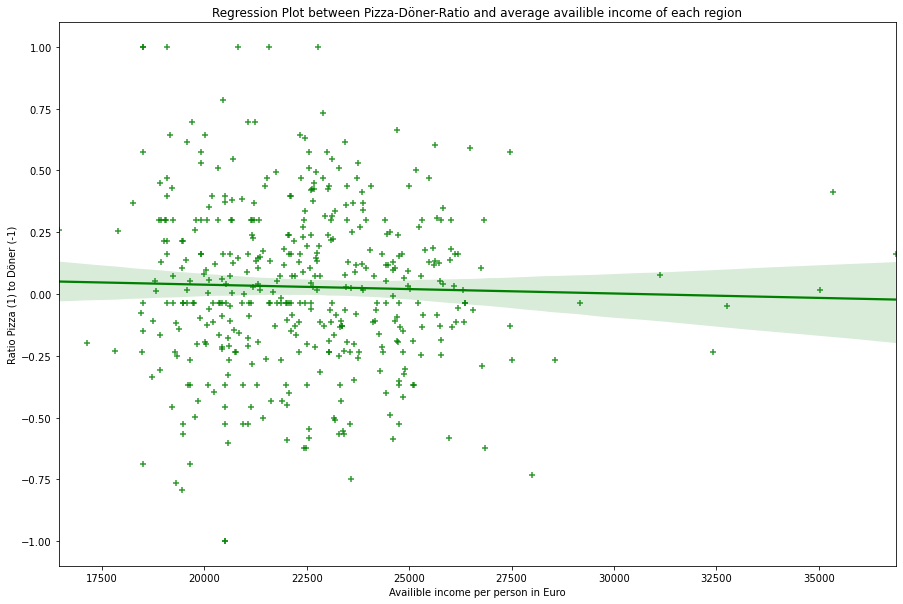

In [12]:
import seaborn as sns
from matplotlib import pyplot as plt

plt.figure(figsize=(15, 10))
ax = sns.regplot(x="ve_pp", y="ratio_norm", data=df_data, color='green', marker='+')
ax.set(xlabel='Availible income per person in Euro', ylabel='Ratio Pizza (1) to Döner (-1)') 
ax.set_title('Regression Plot between Pizza-Döner-Ratio and average availible income of each region') 

Text(0.5, 1.0, 'Regression Plot between Pizza-Döner-Ratio and average GDP per Person of each region')

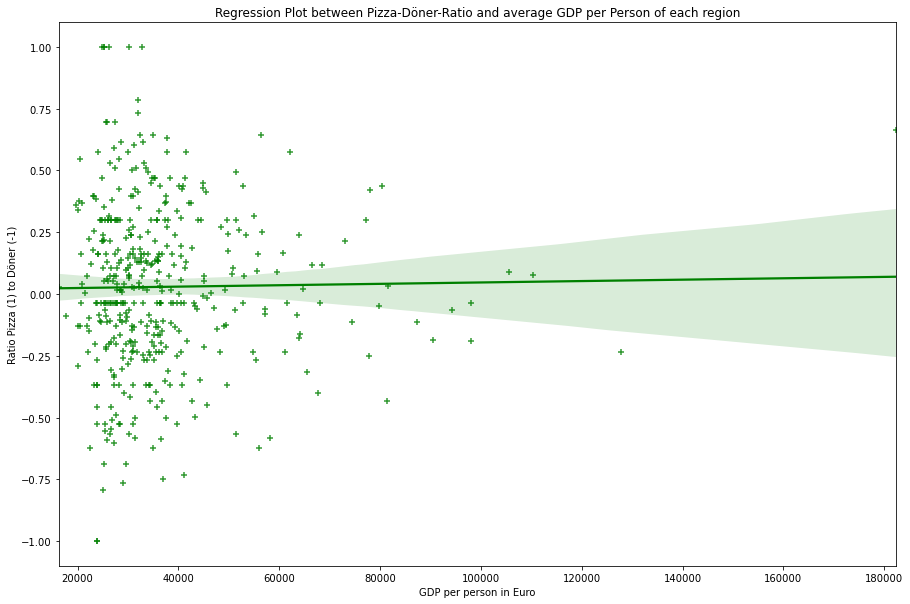

In [13]:
plt.figure(figsize=(15, 10))
ax = sns.regplot(x="bip_pp", y="ratio_norm", data=df_data, color='green', marker='+')
ax.set(xlabel='GDP per person in Euro', ylabel='Ratio Pizza (1) to Döner (-1)') 
ax.set_title('Regression Plot between Pizza-Döner-Ratio and average GDP per Person of each region') 

Text(0.5, 1.0, 'Regression Plot between Density of Pizza+Döner restaurants per 100k inhabitants and average availible income of each region')

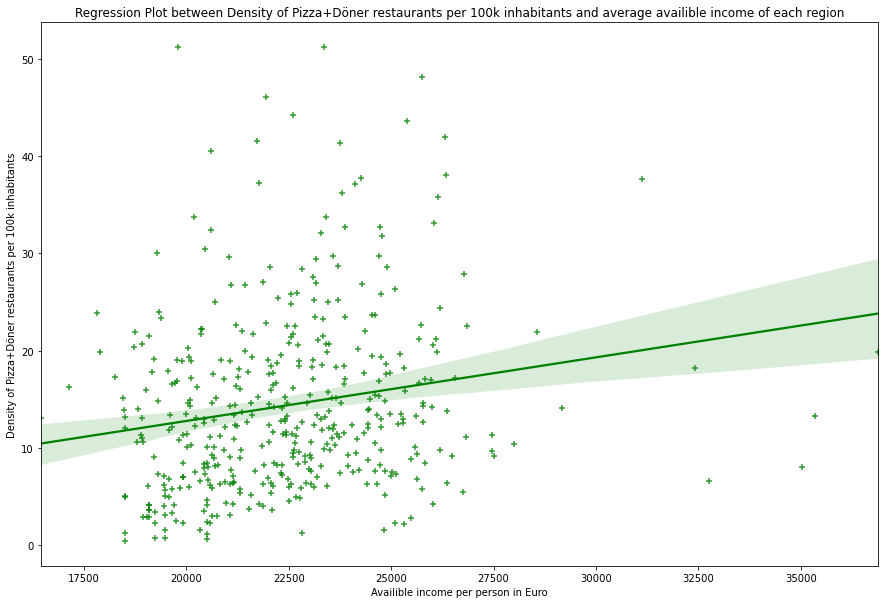

In [14]:
import seaborn as sns

plt.figure(figsize=(15, 10))
ax = sns.regplot(x="ve_pp", y="density_100k", data=df_data, color='green', marker='+')
ax.set(xlabel='Availible income per person in Euro', ylabel='Density of Pizza+Döner restaurants per 100k inhabitants') 
ax.set_title('Regression Plot between Density of Pizza+Döner restaurants per 100k inhabitants and average availible income of each region') 

In [20]:
from scipy import stats
pearson_coef, p_value = stats.pearsonr(df_data['ve_pp'], df_data['density_100k'])
print("The Pearson Correlation Coefficient is", pearson_coef, " with a P-value of P =", p_value)  

The Pearson Correlation Coefficient is 0.18947286144880376  with a P-value of P = 7.130876516495976e-05


Text(0.5, 1.0, 'High and Low Pizza-to-Doener ratio comparison mapped against the availible income per person')

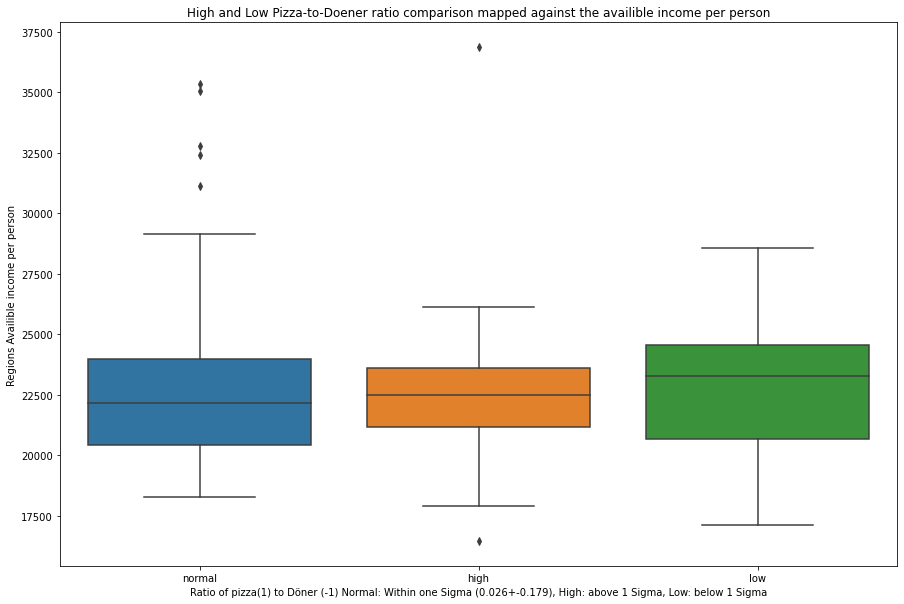

In [15]:
#high = df_data[df_data["ratio_minimum"]>0.18][["ve_pp","bip_pp"]].reset_index().drop(["index"],axis=1)
#low = df_data[df_data["ratio_minimum"]<-0.15][["ve_pp","bip_pp"]].reset_index().drop(["index"],axis=1)
#both = pd.merge(high,low,how="outer")
df_test = df_data.copy()
df_test["high_low_ratio"] = df_data["ratio_minimum"].map(lambda x: "high" if x>0.18 else "low" if x<-0.15 else "normal")

plt.figure(figsize=(15, 10))
ax = sns.boxplot(x="high_low_ratio", y="ve_pp", data=df_test)
ax.set(xlabel='Ratio of pizza(1) to Döner (-1) Normal: Within one Sigma (0.026+-0.179), High: above 1 Sigma, Low: below 1 Sigma', ylabel='Regions Availible income per person') 
ax.set_title('High and Low Pizza-to-Doener ratio comparison mapped against the availible income per person') 

Text(0.5, 1.0, 'High and Low Pizza-to-Doener ratio comparison mapped against the GDP per person')

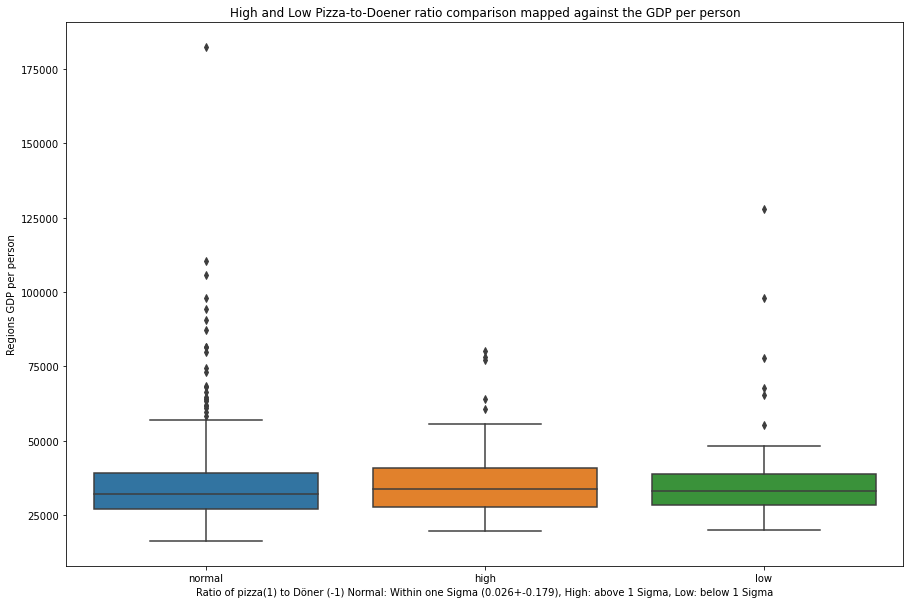

In [16]:
plt.figure(figsize=(15, 10))
ax = sns.boxplot(x="high_low_ratio", y="bip_pp", data=df_test)
ax.set(xlabel='Ratio of pizza(1) to Döner (-1) Normal: Within one Sigma (0.026+-0.179), High: above 1 Sigma, Low: below 1 Sigma', ylabel='Regions GDP per person') 
ax.set_title('High and Low Pizza-to-Doener ratio comparison mapped against the GDP per person') 

Text(0.5, 1.0, 'High, Normal, Low availible income regions and thier according Pizza-to-Doener Ratio')

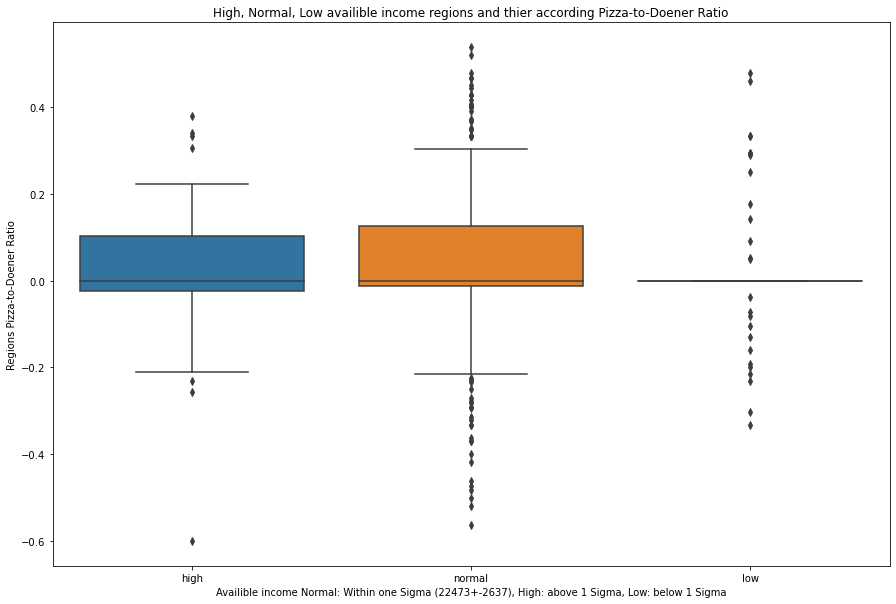

In [17]:
df_test = df_data.copy()
df_test["high_low_ve"] = df_data["ve_pp"].map(lambda x: "high" if x>25110 else "low" if x<19836 else "normal")

plt.figure(figsize=(15, 10))
ax = sns.boxplot(x="high_low_ve", y="ratio_minimum", data=df_test)
ax.set(xlabel='Availible income Normal: Within one Sigma (22473+-2637), High: above 1 Sigma, Low: below 1 Sigma', ylabel='Regions Pizza-to-Doener Ratio') 
ax.set_title('High, Normal, Low availible income regions and thier according Pizza-to-Doener Ratio') 

Text(0.5, 1.0, 'High, Normal, Low GDP regions and thier according Pizza-to-Doener Ratio')

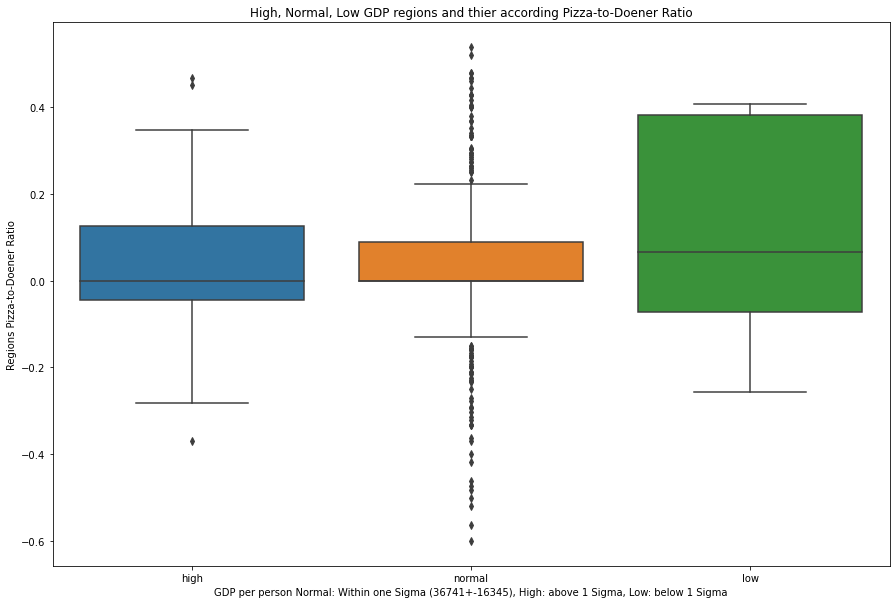

In [18]:
df_test = df_data.copy()
df_test["high_low_gdp"] = df_data["bip_pp"].map(lambda x: "high" if x>53086 else "low" if x<20396 else "normal")

plt.figure(figsize=(15, 10))
ax = sns.boxplot(x="high_low_gdp", y="ratio_minimum", data=df_test)
ax.set(xlabel='GDP per person Normal: Within one Sigma (36741+-16345), High: above 1 Sigma, Low: below 1 Sigma', ylabel='Regions Pizza-to-Doener Ratio') 
ax.set_title('High, Normal, Low GDP regions and thier according Pizza-to-Doener Ratio') 

### Results from the plots above:
### 1. There is no significant correlation between availibe income of a region and the ratio of Pizza places to Doener places.
### 2. There is no significant correlation between a region's GDP (per person) and the ratio of Pizza places to Doener places.
### 3. Even though it looks like it from a first view, the positive correlation between the density of Pizza+Döner restaurants and the availibe income reaching for ~10 per 100k for poor regions to ~20 per 100k for rich regions has a high p-value meaning the correlation could be random.

## 5.3 Regional analysis

In [324]:
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='Ratio of Doener (-1) to Pizza (+1)',
    data=df_data,
    columns=['id_json', 'ratio_minimum'],
    key_on='feature.id',
    fill_color='RdBu',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Ratio of Doener (-1) to Pizza (+1)'
)

folium.LayerControl().add_to(m)
m

### Results:
### 1. There are regions and clusters with clear dominance of either Pizza or Doener. 
### 2. It hence would make sense to choose the region accordingly and choose the richest one.

In [328]:
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='Pizza+Doener density per 100k inhabitants',
    data=df_data,
    columns=['id_json', 'density_100k'],
    key_on='feature.id',
    fill_color='YlOrBr',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Pizza+Doener density per 100k inhabitants'
)

folium.LayerControl().add_to(m)
m

### Results:
### 1. The density (pizza+doener restaurants per 100k inhabitants) differs widely, meaning it is a factor that should be respected in the final choice of the region.

## 5.4 Choose regions with highest pizza and highst döner ratio and show thier GDP and availe income compared to the mean

In [329]:
df_result = df_data.copy()
#df_result["high_low_ratio"] = df_result["ratio_minimum"].map(lambda x: "high" if x>0.18 else "low" if x<-0.15 else "normal")
doener_kings = df_result.sort_values(by=['ratio_minimum'])[:10][["Gebietseinheit","id_json","doener","pizza","ratio_minimum","ve_pp","bip_pp","density_100k"]]
doener_kings["availible_income_rel_to_avg"] = doener_kings["ve_pp"]-22473
doener_kings["GDP_rel_to_avg"] = doener_kings["bip_pp"]-36741
doener_kings

,Gebietseinheit,id_json,doener,pizza,ratio_minimum,ve_pp,bip_pp,density_100k,availible_income_rel_to_avg,GDP_rel_to_avg
330,"Bad Dürkheim, Landkreis",316,24.0,6.0,-0.600000,26863,22551,22.556391,4390,-14190
169,Main-Kinzig-Kreis,184,25.0,7.0,-0.562500,24607,36532,7.637232,2134,-209
171,Odenwaldkreis,186,19.0,6.0,-0.520000,22564,26668,25.773196,91,-10073
165,"Bergstraße, Landkreis",178,39.0,13.0,-0.500000,24752,28488,19.330855,2279,-8253
404,"Ostholstein, Kreis",404,20.0,7.0,-0.481481,23179,26919,13.432836,706,-9822
332,"Germersheim, Landkreis",319,28.0,10.0,-0.473684,23173,37489,29.457364,700,748
335,"Südliche Weinstraße, Landkreis",330,19.0,7.0,-0.461538,24538,27569,23.636364,2065,-9172
167,"Groß-Gerau, Landkreis",182,34.0,14.0,-0.416667,22014,45716,17.582418,-459,8975
122,"Miltenberg, Landkreis",151,21.0,9.0,-0.400000,23343,34398,23.255814,870,-2343
22,"Calw, Landkreis",46,13.0,6.0,-0.368421,24437,29286,12.025316,1964,-7455


In [334]:
m = folium.Map(location=[52, 8], zoom_start=6)
m.choropleth(
    geo_data=geo_data_germany,
    name='Most Doener-loving regions colored by thier above-average income',
    data=doener_kings,
    columns=['id_json', 'availible_income_rel_to_avg'],
    key_on='feature.id',
    fill_color='Greens',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Most Doener-loving colored by thier above-average income'
)

folium.LayerControl().add_to(m)
m

In [331]:
pizza_kings = df_result.sort_values(by=['ratio_minimum'], ascending=False)[:10][["Gebietseinheit","id_json","doener","pizza","ratio_minimum","ve_pp","bip_pp","density_100k"]]
pizza_kings["availible_income_rel_to_avg"] = pizza_kings["ve_pp"]-22473
pizza_kings["GDP_rel_to_avg"] = pizza_kings["bip_pp"]-36741
pizza_kings

,Gebietseinheit,id_json,doener,pizza,ratio_minimum,ve_pp,bip_pp,density_100k,availible_income_rel_to_avg,GDP_rel_to_avg
48,"Berchtesgadener Land, Landkreis",87,6.0,20.0,0.538462,22547,33571,24.761905,74,-3170
267,"Leverkusen, Kreisfreie Stadt",291,6.0,19.0,0.520000,21756,51469,15.243902,-717,14728
269,Rhein-Erft-Kreis,293,6.0,17.0,0.478261,22675,34641,4.904051,202,-2100
414,"Jena, Kreisfreie Stadt",420,6.0,17.0,0.478261,18919,44877,20.720721,-3554,8136
265,"Bonn, Kreisfreie Stadt",286,12.0,33.0,0.466667,23471,80288,13.803681,998,43547
285,"Bielefeld, Kreisfreie Stadt",262,8.0,22.0,0.466667,23037,41016,9.009009,564,4275
259,"Wuppertal, Kreisfreie Stadt",283,12.0,33.0,0.466667,21480,36429,12.711864,-993,-312
339,"Saarbrücken, Regionalverband",341,17.0,46.0,0.460317,19205,44904,19.090909,-3268,8163
205,"Braunschweig, Kreisfreie Stadt",222,11.0,29.0,0.450000,22612,78057,16.129032,139,41316
39,Alb-Donau-Kreis,21,10.0,26.0,0.444444,23854,32093,18.461538,1381,-4648


In [335]:
m = folium.Map(location=[52, 8], zoom_start=6)
m.choropleth(
    geo_data=geo_data_germany,
    name='Most Pizza-loving regions colored by thier above-average income',
    data=pizza_kings,
    columns=['id_json', 'availible_income_rel_to_avg'],
    key_on='feature.id',
    fill_color='Greens',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Most Pizza-loving regions colored by thier above-average income'
)

folium.LayerControl().add_to(m)
m

In [333]:
df_pizza_doener_kings = pd.merge(pizza_kings,doener_kings,how="outer")
m = folium.Map(location=[52, 8], zoom_start=6)

m.choropleth(
    geo_data=geo_data_germany,
    name='Best Pizza (red) and best Doener (oragne) regions',
    data=df_pizza_doener_kings,
    columns=['id_json', 'ratio_minimum'],
    key_on='feature.id',
    fill_color='YlOrRd',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Best Pizza (red) and best Doener (oragne) regions'
)

folium.LayerControl().add_to(m)
m

### Results and recommendations:
### 1. Since our client does not fear competition (as said his Pizza AND Doener skills are beyond reach), he is best served to go where the people like the according food and have money.
### 2. The recommendation hence is to open a Döner in "Bad Dürkheim" region where people apperantly crave the Döner Kebab and are loaded. 
### 3."Main-Kinzig-Kreis" would be a good alternative, it is not quite as rich but they only have 1/3rd of the density there compared to "Bad Dürkheim". 
### 4.In case the client last minute decides that Pizza is better (righfully so), then a good bet would be "Bonn" where the people would sell thier grandma for a good pizza; but they don't have to because they have plenty of ca$h and the productivity of the region is insanly good.
### 5. "Rhein-Erft-Kreis" would be the alternative for Pizza, due to an severe lack of good resturants per 100k inhabitants and a high pizza preference and average income.